# Airline Analysis

In this project, you'll imagine that you work for a travel agency and need to know the ins and outs of airline prices for your clients. You want to make sure that you can find the best deal for your client and help them to understand how airline prices change based on different factors.

You decide to look into your favorite airline. The data include:
- `miles`: miles traveled through the flight
- `passengers`: number of passengers on the flight
- `delay`: take-off delay in minutes
- `inflight_meal`: is there a meal included in the flight?
- `inflight_entertainment`: are there free entertainment systems for each seat?
- `inflight_wifi`: is there complimentary wifi on the flight?
- `day_of_week`: day of the week of the flight
- `weekend`: did this flight take place on a weekend?
- `coach_price`: the average price paid for a coach ticket
- `firstclass_price`: the average price paid for first-class seats
- `hours`: how many hours the flight took
- `redeye`: was this flight a redeye (overnight)?

In this project, you'll explore a dataset for the first time and get to know each of these features. Keep in mind that there's no one right way to address each of these questions. The goal is simply to explore and get to know the data using whatever methods come to mind.

You will be working in this file. Note that there is the file **Airline Analysis_Solution.ipynb** that contains the solution code for this project. We highly recommend that you complete the project on your own without checking the solution, but feel free to take a look if you get stuck or if you want to compare answers when you're done.

In order to get the plots to appear correctly in the notebook, you'll need to show and then clear each plot before creating the next one using the following code:

```py
plt.show() # Show the plot
plt.clf() # Clear the plot
```

Clearing the plot will not erase the plot from view, it will just create a new space for the following graphic.

## Univariate Analysis

1. What do coach ticket prices look like? What are the high and low values? What would be considered the average? Does $500 seem like a good price for a coach ticket?

,miles,passengers,delay,inflight_meal,inflight_entertainment,inflight_wifi,day_of_week,redeye,weekend,coach_price,firstclass_price,hours
0,792,172,0,No,Yes,Yes,Sunday,Yes,Yes,338.820,1571.02,1
1,3163,214,0,No,Yes,Yes,Sunday,No,Yes,472.655,1663.70,6
2,1832,212,0,No,Yes,No,Friday,No,Yes,351.960,1429.86,3
3,925,213,0,No,Yes,Yes,Saturday,No,Yes,387.835,1558.76,2
4,967,217,0,Yes,Yes,Yes,Monday,No,No,374.735,1245.58,2


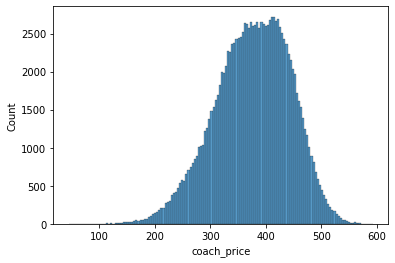

Max price: 593.635
Min price: 44.415
Median price: 380.56
Mean price: 376.58525308213905


<Figure size 432x288 with 0 Axes>

In [58]:
import pandas as pd
import numpy as np
import seaborn as sns
import statsmodels
import matplotlib.pyplot as plt
import math
import plotly 

## Read in Data
flight = pd.read_csv("flight.csv")
display(flight.head())

## Task 1
sns.histplot(flight.coach_price)
plt.show()
plt.clf()

max = np.max(flight.coach_price)
min = np.min(flight.coach_price)
mean = np.mean(flight.coach_price)
median = np.median(flight.coach_price)
print('Max price: ' + str(max))
print('Min price: ' + str(min))
print('Median price: ' + str(median))
print('Mean price: ' + str(mean))


From the above it is clear to see that $500 is not a good price for a coach ticket. Before task 2, in the next code cell I will show a nicer and more interactive way of quickly viewing the distribution of 'coach_price' using the Pandas and Plotly modules.

In [59]:
flight.coach_price.plot.hist(x = 'coach_price', backend = 'plotly')

2. Now visualize the coach ticket prices for flights that are 8 hours long. What are the high, low, and average prices for 8-hour-long flights? Does a $500 dollar ticket seem more reasonable than before?

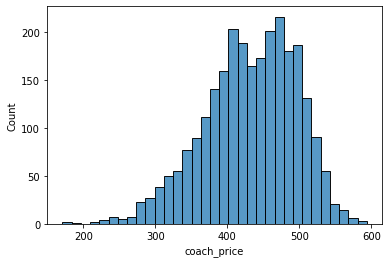

Max price: 593.635
Min price: 170.77
Median price: 437.115
Mean price: 431.834377372817


<Figure size 432x288 with 0 Axes>

In [60]:
## Task 2
sns.histplot(flight.coach_price[flight.hours == 8])
plt.show()
plt.clf()

max = np.max(flight.coach_price[flight.hours == 8])
min = np.min(flight.coach_price[flight.hours == 8])
mean = np.mean(flight.coach_price[flight.hours == 8])
median = np.median(flight.coach_price[flight.hours == 8])
print('Max price: ' + str(max))
print('Min price: ' + str(min))
print('Median price: ' + str(median))
print('Mean price: ' + str(mean))


For 8 hour long flights $500 is only a bit expensive than average making it more reasonable.

In [61]:
flight.coach_price[flight.hours == 8].plot.hist(x = 'coach_price', backend = 'plotly')

3. How are flight delay times distributed? Let's say there is a short amount of time between two connecting flights, and a flight delay would put the client at risk of missing their connecting flight. You want to better understand how often there are large delays so you can correctly set up connecting flights. What kinds of delays are typical?

In [62]:
## Task 3
flight.delay.plot.hist(x= 'delay', backend = 'plotly')

In [63]:
flight.delay[flight.delay <= 580].plot.hist(x = 'delay', backend = 'plotly')

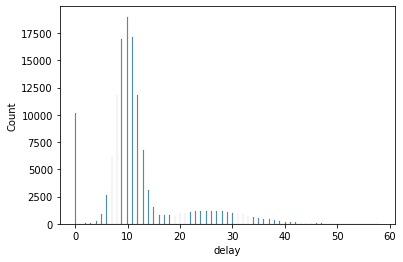

<Figure size 432x288 with 0 Axes>

In [64]:
sns.histplot(flight.delay[flight.delay <= 580])
plt.show()
plt.clf()

After inspecting the first plot using the interactive user interface provided by plotly we can see that there are many outliers. In the plots following, the plotted delay times have been restricted to delays of less than or equal 580 to easier visualise the data. From the plots we can see that delays of around 10 minutes are most typical.

## Bivariate Analysis

4. Create a visualization that shows the relationship between coach and first-class prices. What is the relationship between these two prices? Do flights with higher coach prices always have higher first-class prices as well?

In [73]:
## Task 4
flight.plot.scatter(x = 'coach_price', y = 'firstclass_price', backend = 'plotly')

In [130]:
pct = 0.05
flight_samp = flight.sample(n = int(flight.shape[0]*pct))

flight_samp.plot.scatter(x = 'coach_price', y = 'firstclass_price', backend = 'plotly')

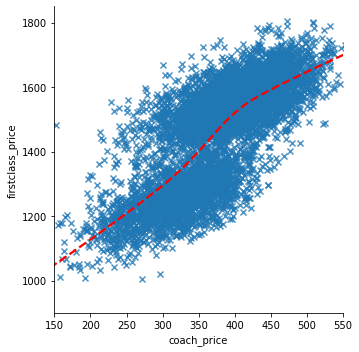

<Figure size 432x288 with 0 Axes>

In [131]:
sns.lmplot(x = "coach_price", y = "firstclass_price", data = flight_samp, markers = 'x', line_kws={'color': 'red', 'ls': '--'}, lowess=True)
plt.axis([150,550,900,1850])
plt.show()
plt.clf()

By creating a simple scatterplot between the two variables you can see that there are way too many data points to easily see a relationship between the two variables. Ways around this is too change the opacity of the data points and the marker style of them. What we have done above is use the `.sample()` method and `.lmplot()` to plot a random sample with a size of our choosing from the original data.

The plots show that there is a positive correlation between coach price and first-class prive of a given airline.

5. What is the relationship between coach prices and inflight features &mdash; inflight meal, inflight entertainment, and inflight WiFi? Which features are associated with the highest increase in price?

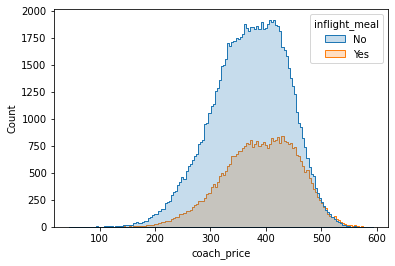

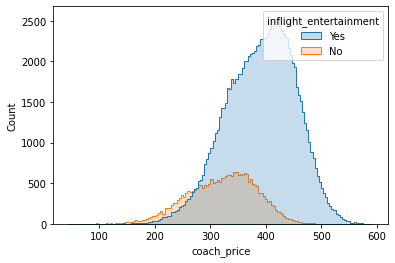

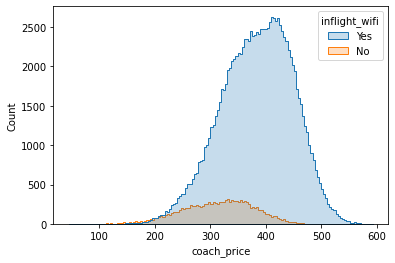

<Figure size 432x288 with 0 Axes>

In [132]:
## Task 5
# Inflight Meals
sns.histplot(flight, x = "coach_price", hue = flight.inflight_meal, element = 'step')
plt.show()
plt.clf()

# Inflight Entertainment
sns.histplot(flight, x = "coach_price", hue = flight.inflight_entertainment, element = 'step')
plt.show()
plt.clf()

# Inflight WiFi
sns.histplot(flight, x = "coach_price", hue = flight.inflight_wifi, element = 'step')
plt.show()
plt.clf()


6. How does the number of passengers change in relation to the length of flights?

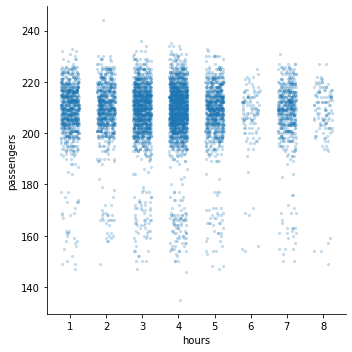

<Figure size 432x288 with 0 Axes>

In [133]:
## Task 6
sns.lmplot(x = "hours", y = "passengers", data = flight_samp, x_jitter = 0.25, scatter_kws={"s": 5, "alpha":0.2}, fit_reg = False)
plt.show()
plt.clf()


## Multivariate Analysis

7. Visualize the relationship between coach and first-class prices on weekends compared to weekdays.

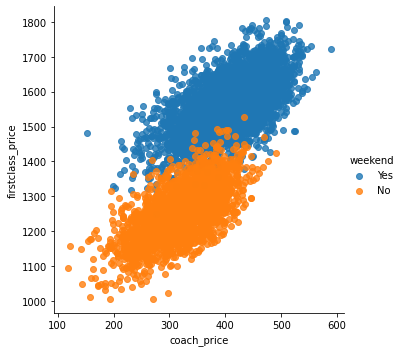

<Figure size 432x288 with 0 Axes>

In [135]:
## Task 7
sns.lmplot(x = 'coach_price', y = 'firstclass_price', hue = 'weekend', data = flight_samp, fit_reg=False)
plt.show()
plt.clf()


8. How do coach prices differ for redeyes and non-redeyes on each day of the week?

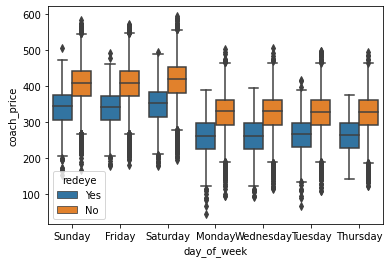

<Figure size 432x288 with 0 Axes>

In [136]:
## Task 8
sns.boxplot(x = "day_of_week", y = "coach_price", hue = "redeye", data = flight)
plt.show()
plt.clf()